In [1]:
import numpy as np
import pandas as pd
import vectorbt as vbt
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas_ta as ta
import talib 
import yfinance as yf 
import warnings
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

In [2]:
df = pd.read_csv('2022.2.9EURUSD-H1-NoSession.csv')
df.Date = df.Date.astype(str)+' '+ df.Time
df.Date = pd.to_datetime(df.Date)
df.drop(columns= ['Time'], inplace = True)
df = df.set_index('Date')

In [3]:
#initial
def set_up_df(df:pd.DataFrame , index):  
    df1    =   pd.DataFrame(columns=index)
    df1['date']  =    df.index 
    df1.date = pd.to_datetime(df1.date,format='%Y-%m-%d')
    df1 = df1.set_index('date')
    return df1

#for calculate duration
def convert_to_hours(delta):
    total_seconds = delta.total_seconds()
    hours = str(int(total_seconds // 3600))
    return hours

#Performance Matric
def cal_consecutive(df:pd.DataFrame):
    df['win']= np.sign(df) # assign sign on log
    blocks = df['win'].ne(df['win'].shift()).cumsum() 
    df['consecutive_WL'] = df['win'].groupby(blocks).cumsum()
    return df['consecutive_WL'] 

def Cal_portstat(port):
    port_return = port.total_return().to_frame()
    port_return['MaxDD'] = port.max_drawdown()
    port_return['NumTrade'] = port.trades.count()
    port_return['WinRate'] = port.trades.win_rate()
    port_return['AvgWinningTrade'] = port.trades.winning.returns.mean()
    port_return['AvgLosingTrade'] = port.trades.losing.returns.mean()
    port_return['SharpRatio'] = port.returns_acc.sharpe_ratio()
    return port_return

def Cal_pip(df):
    pip = []
    pipp = df['Avg Exit Price'] - df['Avg Entry Price']
    for i in portfinal['Direction']:
        if i == 'Long':
            pip.append(1)
        else :
            pip.append(-1)    
    return (pip * pipp) 

def Cal_mae_mfe(data,port):
    MAE = []
    MFE = []
    for i,j,y,k in zip(port['Entry Timestamp'], port['Exit Timestamp'], port['Avg Entry Price'], port['Direction']):
        if k == 'Long':
            MFE.append((data.loc[i:j]['High'].max() - y)/y)
            MAE.append((y - df.loc[i:j]['Low'].min())/y)
        else :
            MAE.append((data.loc[i:j]['High'].max() - y)/y)
            MFE.append((y - df.loc[i:j]['Low'].min())/y)
    return MAE, MFE  

def Calkelly(port, init_cash = 10000):
    W = port.stats()[15]/100
    A = abs(port.stats()[19])
    B = port.stats()[18]
    Percent_kelly = (W/A) - ((1-W)/B)
    riskpertrade = Percent_kelly * init_cash
    size = (riskpertrade/df['sl_stop'])/ df.Close
    print(f'Percent_kelly = {Percent_kelly}')


In [ ]:
ema1 = df.ta.ema(50)
ema2 = df.ta.ema(200) 

df['atr'] = df.ta.atr()
multiply = 2.5
df['sl_stop'] = (df['atr'] * multiply) / df.Close

lower = df.ta.donchian(28,28)['DCL_28_28']
mid = df.ta.donchian(28,28)['DCM_28_28']
upper = df.ta.donchian(28,28)['DCU_28_28']
    
#define Signal
long_signal = (upper > upper.shift()) & (ema1>ema2)
short_signal = (lower < lower.shift()) & (ema1<ema2)
long_exit = (lower < lower.shift())
short_exit = (upper > upper.shift())
    
LongEntries = long_signal
LongExit= long_exit      
ShortEntries= short_signal
ShortExit= short_exit

size = (1000/df['sl_stop'])/ df.Close
port = vbt.Portfolio.from_signals(df.Close,
                                    entries = LongEntries,
                                    exits = LongExit,
                                    short_entries = ShortEntries,
                                    short_exits = ShortExit,
                                    freq = 'H',
                                    init_cash = 10000,
                                    fees = 0.00,size=size,
                                    slippage = 0.00, sl_stop = df.sl_stop)
Calkelly(port)### Default

In [18]:

df['atr'] = df.ta.atr()
multiply = 0.5
df['sl_stop'] = (df['atr'] * multiply) / df.Close
ema = talib.EMA(df.Close, 50)
sar = talib.SAR(df.High, df.Low)

l_1 = df.Close.vbt.crossed_above(sar) 

long_signal = l_1
        
s_1 = df.Close.vbt.crossed_below(sar)

short_signal = s_1 
    
#define Signal
long_exit = s_1  
short_exit = l_1

LongEntries = long_signal
LongExit= long_exit    
ShortEntries= short_signal
ShortExit= short_exit


size = (100/df['sl_stop'])/ df.Close
port = vbt.Portfolio.from_signals(df.Close,
                                    entries = LongEntries,
                                    exits = LongExit,
                                    short_entries = ShortEntries,
                                    short_exits = ShortExit,
                                    freq = 'H',
                                    init_cash = 10000,
                                    fees = 0.00,size=size,
                                    slippage = 0.00, sl_stop = df.sl_stop)
Calkelly(port)

Percent_kelly = 0.05695643234274539


In [15]:
port.stats()

Start                               2003-05-05 00:00:00
End                                 2022-02-07 23:00:00
Period                               4883 days 13:00:00
Start Value                                     10000.0
End Value                                  41292.339259
Total Return [%]                             312.923393
Benchmark Return [%]                           1.917013
Max Gross Exposure [%]                       121.385862
Total Fees Paid                                     0.0
Max Drawdown [%]                              50.154236
Max Drawdown Duration                1110 days 14:00:00
Total Trades                                       8248
Total Closed Trades                                8248
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  28.697866
Best Trade [%]                                 4.124656
Worst Trade [%]                               -1

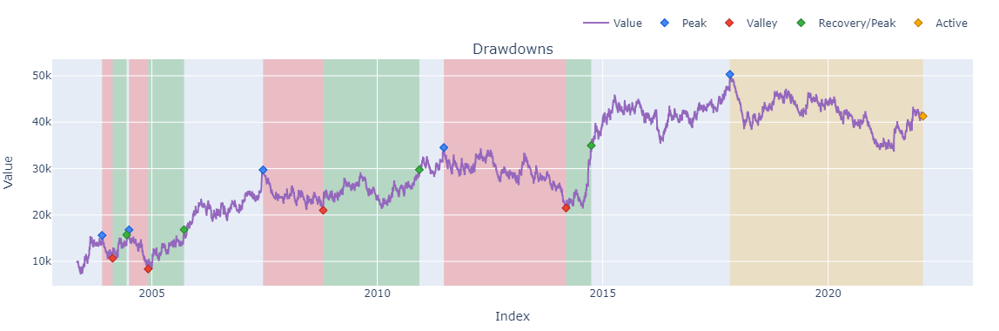

In [16]:
port.plot(subplots=['drawdowns']).show()

### Add SL

In [ ]:
# Optimise Multiply
df['atr'] = df.ta.atr()
portstats = []
start, end, step = (0.5, 4, 0.1)
array = np.arange(start,end,step)
for i in array:
    multiply = i
    df['sl_stop'] = (df['atr'] * multiply) / df.Close
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = LongEntries,
                                    exits = LongExit,
                                    short_entries = ShortEntries,
                                    short_exits = ShortExit,
                                    freq = 'H',
                                    init_cash = 10000,
                                    fees = 0.00,
                                    slippage = 0.00,
                                    sl_stop = df['sl_stop']  
                                     )
    portstats.append(port.stats())
pd.DataFrame(portstats).sort_values('Sharpe Ratio',ascending=False).head(5)

In [ ]:
port.stats()

In [ ]:
port.plot(subplots=['drawdowns']).show()

### Final

In [ ]:
df['atr'] = df.ta.atr()
df['sl_stop'] = (df['atr'] * 0.7) / df.Close

sar = talib.SAR(df.High, df.Low)
rsi = df.ta.rsi(14)


l_1 = df.Close.vbt.crossed_above(sar)
l_2 = rsi > 50
long_signal = l_1 & l_2
        
s_1 = df.Close.vbt.crossed_below(sar)
s_2 = rsi < 50
short_signal = s_1 & s_2
        
long_exit = s_1  
short_exit = l_1

LongEntries = long_signal
LongExit= long_exit    
ShortEntries= short_signal
ShortExit= short_exit

port = vbt.Portfolio.from_signals(df.Close,
                                entries = LongEntries,
                                exits = LongExit,
                                short_entries = ShortEntries,
                                short_exits = ShortExit,
                                freq = 'H',
                                init_cash = 10000,
                                fees = 0.00,
                                slippage = 0.00, sl_stop = df['sl_stop'])
Calkelly(port)

In [ ]:
port.stats()

In [ ]:
port.plot(['drawdowns']).show()

### Drawdown Period

In [ ]:
Fig = port.value()['2009-08-01 00:00:00':'2010-03-01 00:00:00'].vbt.plot()
Fig2 = port.close['2009-08-01 00:00:00':'2010-03-01 00:00:00'].vbt.plot()
Fig.show()
Fig2.show()

--------------------------------------

### Research

In [ ]:
portfinal = port.trades.records_readable
tradingdata = df.reset_index()
tradingdata = tradingdata[['Date', 'Open', 'High', 'Low', 'Close']]

In [ ]:
tradingdata['_normPrice'] = (tradingdata.Close-tradingdata.Low)/(tradingdata.High-tradingdata.Low)
tradingdata['_avgreturn5'] = ta.sma(tradingdata.Close.pct_change(),5)
tradingdata['_avgreturn10'] = ta.sma(tradingdata.Close.pct_change(),10)
tradingdata['_avgreturn30'] = ta.sma(tradingdata.Close.pct_change(),30)
tradingdata['_avgreturn60'] = ta.sma(tradingdata.Close.pct_change(),60)
tradingdata['_rsi5'] = ta.rsi(tradingdata['Close'],5)
tradingdata['_rsi7'] = ta.rsi(tradingdata['Close'],7)
tradingdata['_rsi14'] = ta.rsi(tradingdata['Close'],14)
tradingdata['_rsi30'] = ta.rsi(tradingdata['Close'],30)
tradingdata['_rsi60'] = ta.rsi(tradingdata['Close'],60)
tradingdata['_slope3'] = tradingdata.ta.slope(3)
tradingdata['_slope5'] = tradingdata.ta.slope(5)
tradingdata['_slope10'] = tradingdata.ta.slope(10)
tradingdata['_slope20'] = tradingdata.ta.slope(20)
tradingdata['_macd12_26'] = tradingdata.ta.macd(12,26)['MACDh_12_26_9']
tradingdata['_macd10_30'] = tradingdata.ta.macd(10,30)['MACDh_10_30_9']
tradingdata['_macd5_10'] = tradingdata.ta.macd(5,10)['MACDh_5_10_9']
tradingdata['_macd2_10'] = tradingdata.ta.macd(2,10)['MACDh_2_10_9']
tradingdata['_macd12_26_change'] = tradingdata.ta.macd(12,26)['MACDh_12_26_9'].pct_change()
tradingdata['_macd10_30_change'] = tradingdata.ta.macd(10,30)['MACDh_10_30_9'].pct_change()
tradingdata['_macd5_10_change'] = tradingdata.ta.macd(5,10)['MACDh_5_10_9'].pct_change()
tradingdata['_macd2_10_change'] = tradingdata.ta.macd(2,10)['MACDh_2_10_9'].pct_change()
tradingdata['_avgema2_price'] = tradingdata.ta.ema(2)/tradingdata.Close
tradingdata['_avgema10_price'] = tradingdata.ta.ema(10)/tradingdata.Close
tradingdata['_avgema20_price'] = tradingdata.ta.ema(20)/tradingdata.Close
tradingdata['_avgema50_price'] = tradingdata.ta.ema(50)/tradingdata.Close
tradingdata['BBwid'] = tradingdata.ta.bbands()['BBU_5_2.0'] - tradingdata.ta.bbands()['BBL_5_2.0']
tradingdata['_adx'] = ta.adx(tradingdata['High'],tradingdata['Low'],tradingdata['Close']).iloc[:,:1]
tradingdata['_stochK'] = ta.stoch(tradingdata['High'], tradingdata['Low'], tradingdata['Close']).iloc[:,:1]
tradingdata['_natr'] = ta.natr(tradingdata['High'], tradingdata['Low'], tradingdata['Close'])
tradingdata['_stdev'] = ta.stdev(tradingdata['Close'])
tradingdata['_truerange'] =  ta.true_range(tradingdata['High'], tradingdata['Low'], tradingdata['Close'])
tradingdata['_stdev'] = ta.stdev(tradingdata['Close'])

In [ ]:
full_position_data = tradingdata.merge(portfinal, left_on = 'Date', right_on = 'Entry Timestamp')
full_position_data.dropna(inplace = True)

##### only long position

In [ ]:
full_position_data = full_position_data[full_position_data['Direction'] == 'Long']

In [ ]:
# class count
full_position_data['target'] = np.where(full_position_data['Return'] > 0, 1, 0)
class_count_0, class_count_1 = full_position_data['target'].value_counts()

class_0 = full_position_data[full_position_data['target'] == 0]
class_1 = full_position_data[full_position_data['target'] == 1]
print('class 0:', class_0.shape)
print('class 1:', class_1.shape)

In [ ]:
class_1_sample = class_1.sample(500)
class_0_sample = class_0.sample(500)
mldata = pd.concat([class_1_sample, class_0_sample], axis=0)
mldata['target'].value_counts()

In [ ]:
cols = ['_normPrice', '_avgreturn5',
       '_avgreturn10', '_avgreturn30', '_avgreturn60', '_rsi5', '_rsi7',
       '_rsi14', '_rsi30', '_rsi60', '_slope3', '_slope5', '_slope10',
       '_slope20', '_macd12_26', '_macd10_30', '_macd5_10', '_macd2_10',
       '_macd12_26_change', '_macd10_30_change', '_macd5_10_change',
       '_macd2_10_change', '_avgema2_price', '_avgema10_price',
       '_avgema20_price', '_avgema50_price', 'BBwid', '_adx', '_stochK',
       '_natr', '_stdev', '_truerange']
X = mldata[cols]
y = mldata['target']

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data = mldata, x ='_adx' , hue = 'target', fill=True)

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data = mldata, x ='_rsi14' , hue = 'target', fill=True)

In [ ]:
import pingouin as pg
for i in cols:
    a = mldata[mldata.target ==1][i].reset_index(drop=True)
    b = mldata[mldata.target ==0][i].reset_index(drop=True)
    print(i)
    print(pg.ttest(a, b).iloc[:,:7])